In [6]:
import json
import pandas as pd
import numpy as np

In [2]:
with open('/opt/ml/detection/dataset/train.json','r') as f:
    json_data = json.load(f)
print(json.dumps(json_data, indent = '\t'))

{
	"info": {
		"year": 2021,
		"version": "1.0",
		"description": "Recycle Trash",
		"contributor": "Upstage",
		"url": null,
		"date_created": "2021-02-02 01:10:00"
	},
	"licenses": [
		{
			"id": 0,
			"name": "CC BY 4.0",
			"url": "https://creativecommons.org/licenses/by/4.0/deed.ast"
		}
	],
	"images": [
		{
			"width": 1024,
			"height": 1024,
			"file_name": "train/0000.jpg",
			"license": 0,
			"flickr_url": null,
			"coco_url": null,
			"date_captured": "2020-12-26 14:44:23",
			"id": 0
		},
		{
			"width": 1024,
			"height": 1024,
			"file_name": "train/0001.jpg",
			"license": 0,
			"flickr_url": null,
			"coco_url": null,
			"date_captured": "2021-01-10 16:30:39",
			"id": 1
		},
		{
			"width": 1024,
			"height": 1024,
			"file_name": "train/0002.jpg",
			"license": 0,
			"flickr_url": null,
			"coco_url": null,
			"date_captured": "2020-12-27 17:55:52",
			"id": 2
		},
		{
			"width": 1024,
			"height": 1024,
			"file_name": "train/0003.jpg",
			"license": 0,
			"flickr_u

In [131]:
df = pd.DataFrame(columns = ['image_path','category_id','category_name','bbox'])

In [132]:
df

,image_path,category_id,category_name,bbox


In [133]:
DATA_DIR = '/opt/ml/detection/dataset/train'
for i in range(len(json_data['annotations'])):
    category_id = json_data['annotations'][i]['category_id']
    bbox = json_data['annotations'][i]['bbox']
    iscrowd = json_data['annotations'][i]['iscrowd']
    category_name = json_data['categories'][category_id]['name']
    if json_data['annotations'][i]['image_id'] <= 9:
        image_path = DATA_DIR + '/' + '000' + str(json_data['annotations'][i]['image_id']) + '.jpg'
    elif (json_data['annotations'][i]['image_id'] >= 10) and (json_data['annotations'][i]['image_id'] <= 99) :
        image_path = DATA_DIR + '/' + '00' + str(json_data['annotations'][i]['image_id']) + '.jpg'
    elif (json_data['annotations'][i]['image_id'] >= 100) and (json_data['annotations'][i]['image_id'] <= 999):
        image_path = DATA_DIR + '/' + '0' + str(json_data['annotations'][i]['image_id']) + '.jpg'
    elif json_data['annotations'][i]['image_id'] >= 1000:
        image_path = DATA_DIR + '/' + str(json_data['annotations'][i]['image_id']) + '.jpg'

    df.loc[i] = [image_path,category_id,category_name,bbox]

In [134]:
df

,image_path,category_id,category_name,bbox
0,/opt/ml/detection/dataset/train/0000.jpg,0,General trash,"[197.6, 193.7, 547.8, 469.7]"
1,/opt/ml/detection/dataset/train/0001.jpg,3,Metal,"[0.0, 407.4, 57.6, 180.6]"
2,/opt/ml/detection/dataset/train/0001.jpg,7,Plastic bag,"[0.0, 455.6, 144.6, 181.6]"
3,/opt/ml/detection/dataset/train/0001.jpg,4,Glass,"[722.3, 313.4, 274.3, 251.9]"
4,/opt/ml/detection/dataset/train/0001.jpg,5,Plastic,"[353.2, 671.0, 233.7, 103.4]"
...,...,...,...,...
23139,/opt/ml/detection/dataset/train/4882.jpg,5,Plastic,"[0.0, 116.2, 944.1, 814.1]"
23140,/opt/ml/detection/dataset/train/4882.jpg,7,Plastic bag,"[302.1, 439.3, 265.2, 216.1]"
23141,/opt/ml/detection/dataset/train/4882.jpg,0,General trash,"[511.3, 451.1, 58.7, 30.2]"
23142,/opt/ml/detection/dataset/train/4882.jpg,1,Paper,"[255.0, 421.4, 271.7, 195.1]"


In [141]:
import matplotlib.pyplot as plt
import squarify

In [173]:
color = {0 :[(0,125,125) , json_data['categories'][0]['name'],'#007d7d'],
        1 :[(255,0,0), json_data['categories'][1]['name'],'#ff0000'],
        2 :[(255,127,0),json_data['categories'][2]['name'],'#ff7f00'],
        3 :[(255,212,0), json_data['categories'][3]['name'],'#ffd400'],
        4 :[(0,255,0), json_data['categories'][4]['name'],'#00ff00'],
        5 :[(0,0,255),json_data['categories'][5]['name'],'#0000ff'],
        6 :[(80,188,223), json_data['categories'][6]['name'],'#50bcdf'],
        7 :[(139,0,255), json_data['categories'][7]['name'],'#8b00ff'],
        8 :[(150,75,0), json_data['categories'][8]['name'],'#964b00'],
        9 :[(255,255,255),json_data['categories'][9]['name'],'#ffffff'] }

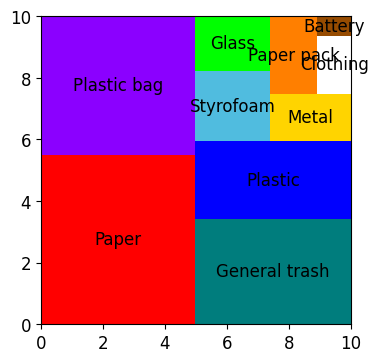

In [174]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = (4, 4)
plt.rcParams['font.size'] = 12

sizes = []
labels = []
color_label = []
for i in range(len(df['category_name'].unique())):
    sizes.append(df['category_name'].value_counts()[i])
    labels.append(df['category_name'].value_counts().index[i])
    for key,value in color.items():
        if value[1] == df['category_name'].value_counts().index[i]:
            color_label.append(color[key][2])

squarify.plot(sizes, 10, 10,label = labels,color = color_label)
plt.show()


In [175]:
import cv2
from PIL import Image,ImageDraw,ImageFont

In [176]:
image_num = 520

In [177]:
if image_num <= 9:
    image_name = '000' + str(image_num) + '.jpg'
elif (json_data['annotations'][i]['image_id'] >= 10) and (json_data['annotations'][i]['image_id'] <= 99) :
    image_name = '00' + str(image_num) + '.jpg'
elif (json_data['annotations'][i]['image_id'] >= 100) and (json_data['annotations'][i]['image_id'] <= 999):
    image_name = '0' + str(image_num) + '.jpg'
elif json_data['annotations'][i]['image_id'] >= 1000:
    image_name = str(image_num) + '.jpg'

In [178]:
bbox_layer = []
category = []
for i in range(len(df)):
    if df['image_path'][i] == '/opt/ml/detection/dataset/train/' + image_name:
        bbox_layer.append(df['bbox'][i])
        category.append(df['category_id'][i])

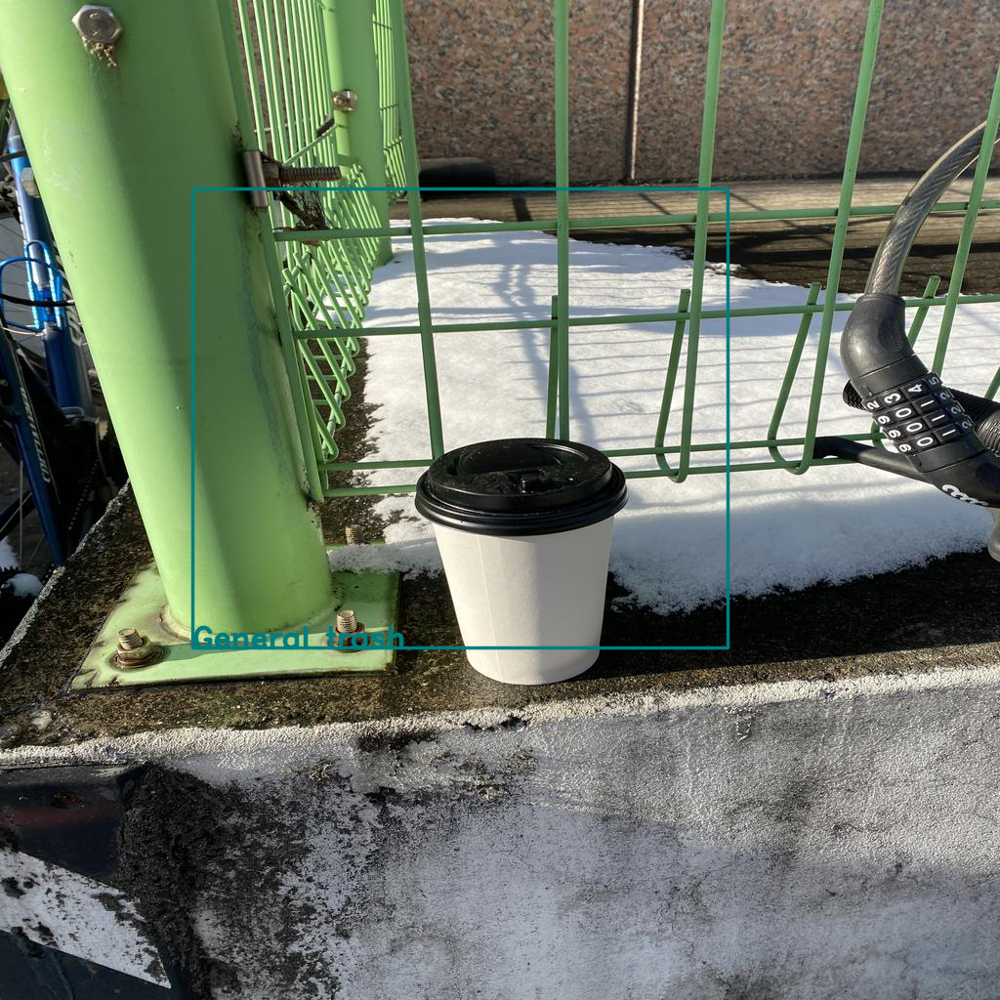

In [179]:
image = np.array(Image.open(df['image_path'].unique()[image_num]))
font = cv2.FONT_HERSHEY_DUPLEX

for i in range(len(category)):
    c1 = bbox_layer[i][0],bbox_layer[i][1]+bbox_layer[i][3]
    c2 = bbox_layer[i][0] + bbox_layer[i][2],bbox_layer[i][1]
    cv2.rectangle(image,(int(c1[0]),int(c1[1])) ,(int(c2[0]),int(c2[1])) ,color[category[i]][0], thickness=2 , lineType=cv2.LINE_AA)
    cv2.putText(image, color[category[i]][1], (int(c1[0]), int(c1[1])), font, 1,color[category[i]][0], 2, cv2.LINE_AA)

    

image = Image.fromarray(image)


image.show()
